<a href="https://colab.research.google.com/github/akbarali2019/Pneomothorax-Classification-and-Segmentation/blob/main/pneumothorax.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
#os.chdir('/content/gdrive/MyDrive/archive.zip')
!mkdir siimdataset
!unzip -q /content/gdrive/MyDrive/archive.zip -d siimdataset/

In [ ]:
pip install glob2

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from PIL import Image
import cv2
import glob
import glob2
%matplotlib inline
from tqdm import tqdm
import shutil

In [ ]:
pip install pydicom

     |████████████████████████████████| 2.0 MB 5.3 MB/s 


In [ ]:
import tensorflow as tf
import pydicom

In [ ]:
import pandas as pd
train_rle = pd.read_csv("/content/siimdataset/pneomx/SIIM_TRAIN_TEST_2/train-rle.csv")
train_rle.head()

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,-1
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,557374 2 1015 8 1009 14 1002 20 997 26 990 32 ...
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,-1
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,514175 10 1008 29 994 30 993 32 991 33 990 34 ...
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,592184 33 976 58 956 73 941 88 926 102 917 109...


In [ ]:
train_df = train_rle
train_df.describe()

,ImageId,EncodedPixels
count,12954,12954
unique,12047,3577
top,1.2.276.0.7230010.3.1.4.8323329.1851.151787516...,-1
freq,10,9378


In [ ]:
train_df.drop_duplicates(subset ="ImageId", keep = 'first', inplace = True)

In [ ]:
train_df.describe()

,ImageId,EncodedPixels
count,12047,12047
unique,12047,2670
top,1.2.276.0.7230010.3.1.4.8323329.4305.151787518...,-1
freq,1,9378


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12047 entries, 0 to 12953
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ImageId         12047 non-null  object
 1    EncodedPixels  12047 non-null  object
dtypes: object(2)
memory usage: 282.4+ KB


In [ ]:
from tqdm import tqdm
import shutil

# create 2 separate directories for train and test dicom images
train_images_dicom = './train_images_dicom/'
test_images_dicom = './test_images_dicom/'

if not os.path.isdir(train_images_dicom):
    os.makedirs(train_images_dicom)
if not os.path.isdir(test_images_dicom):
    os.makedirs(test_images_dicom)

In [ ]:
# move all train dicom images from 'dicom-images-train' to 'train_images_dicom' in a single directory
train_path = '/content/siimdataset/pneomx/SIIM_TRAIN_TEST_2/dicom-images-train'
train_dcm_list = glob2.glob(os.path.join(train_path, '**/*.dcm'))
for filename in tqdm(train_dcm_list):
  shutil.move(str(filename), train_images_dicom)

# move all test dicom images from 'dicom-images-test' to 'test_images_dicom' in a single directory
test_path = '/content/siimdataset/pneomx/SIIM_TRAIN_TEST_2/dicom-images-test'
test_dcm_list = glob2.glob(os.path.join(test_path, '**/*.dcm'))
for filename in tqdm(test_dcm_list):
  shutil.move(str(filename), test_images_dicom)

100%|██████████| 3205/3205 [00:00<00:00, 16354.84it/s]


In [ ]:
# create a dataframe containing ImageId, EncodedPixels and ImagePath
# dicom images has '.dcm' extension, concating '.dcm' with ImageId I get filename
#train_df['DICOM_Path'] = os.path.join(train_images_dicom, (train_df['ImageId']+'.dcm'))
train_df['Image_Path'] = train_images_dicom + train_df['ImageId']+'.dcm'
train_df.head()

,ImageId,EncodedPixels,Image_Path
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,557374 2 1015 8 1009 14 1002 20 997 26 990 32 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,514175 10 1008 29 994 30 993 32 991 33 990 34 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,592184 33 976 58 956 73 941 88 926 102 917 109...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...


In [ ]:
# save the .csv file for further use
train_df.to_csv('train_dicom_imageid_path.csv', index=False)

In [ ]:
# create test dataframe from the test ImageIDs given
test_df = pd.DataFrame(columns = ['ImageId', 'Image_Path'])
test_data = os.listdir(test_images_dicom)
for file in test_data:
  test_df = test_df.append({'ImageId':file[:-4], 'Image_Path':test_images_dicom+file}, ignore_index = True)
test_df.head()


,ImageId,Image_Path
0,ID_708984b8c,./test_images_dicom/ID_708984b8c.dcm
1,ID_dffca7dc0,./test_images_dicom/ID_dffca7dc0.dcm
2,ID_0e0ebf53a,./test_images_dicom/ID_0e0ebf53a.dcm
3,ID_6eb1941d0,./test_images_dicom/ID_6eb1941d0.dcm
4,ID_9cc7afaba,./test_images_dicom/ID_9cc7afaba.dcm


ImageId = 1.2.276.0.7230010.3.1.4.8323329.10016.1517875220.992175


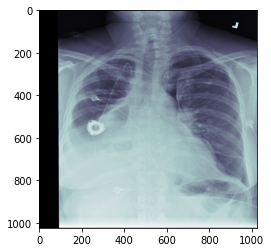

In [ ]:
# displaying a sample image
# https://stackoverflow.com/questions/48185544/read-and-open-dicom-images-using-python
image_row = 4
sample_img = pydicom.read_file(train_df['Image_Path'][image_row]).pixel_array
print('ImageId = '+str(train_df['ImageId'][image_row]))
plt.imshow(sample_img, cmap='bone')
plt.show()

In [ ]:
sample_metadata = pydicom.dcmread(train_df['Image_Path'][image_row])
print(sample_metadata)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.10016.1517875220.992175
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.10016.1517875220.992175
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time      

In [ ]:
# extract few informations from metadata
print("Patient Age = " +str(sample_metadata.PatientAge))
print("Patient Sex = " +str(sample_metadata.PatientSex))
print("Patient Modality = " +str(sample_metadata.Modality))
print("Patient BodyPart = " +str(sample_metadata.BodyPartExamined))
print("Patient ViewPosition = " +str(sample_metadata.ViewPosition))

Patient Age = 57
Patient Sex = F
Patient Modality = CR
Patient BodyPart = CHEST
Patient ViewPosition = PA


In [ ]:
age = []
sex = []
modality = []
bodyPart = []
viewPosition = []

for file in tqdm(train_df['Image_Path']):
  metadata = pydicom.dcmread(file)
  age.append(metadata.PatientAge)
  sex.append(metadata.PatientSex)
  modality.append(metadata.Modality)
  bodyPart.append(metadata.BodyPartExamined)
  viewPosition.append(metadata.ViewPosition)

100%|██████████| 12047/12047 [00:16<00:00, 712.71it/s]


In [ ]:
train_df['Age'] = age
train_df['Sex'] = sex
train_df['Modality'] = modality
train_df['BodyPart'] = bodyPart
train_df['ViewPosition'] = viewPosition
train_df.head()

,ImageId,EncodedPixels,Image_Path,Age,Sex,Modality,BodyPart,ViewPosition
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,62,M,CR,CHEST,PA
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,557374 2 1015 8 1009 14 1002 20 997 26 990 32 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,34,M,CR,CHEST,AP
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,52,F,CR,CHEST,PA
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,514175 10 1008 29 994 30 993 32 991 33 990 34 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,30,F,CR,CHEST,AP
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,592184 33 976 58 956 73 941 88 926 102 917 109...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,57,F,CR,CHEST,PA


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12047 entries, 0 to 12953
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ImageId         12047 non-null  object
 1    EncodedPixels  12047 non-null  object
 2   Image_Path      12047 non-null  object
 3   Age             12047 non-null  object
 4   Sex             12047 non-null  object
 5   Modality        12047 non-null  object
 6   BodyPart        12047 non-null  object
 7   ViewPosition    12047 non-null  object
dtypes: object(8)
memory usage: 1.1+ MB


In [ ]:
train_df.describe()

,ImageId,EncodedPixels,Image_Path,Age,Sex,Modality,BodyPart,ViewPosition
count,12047,12047,12047,12047,12047,12047,12047,12047
unique,12047,2670,12047,93,2,1,1,2
top,1.2.276.0.7230010.3.1.4.8323329.4305.151787518...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,58,M,CR,CHEST,PA
freq,1,9378,1,365,6626,12047,12047,7274


In [ ]:
# remove extra space in EncodedPixels column
train_df.rename(columns = {' EncodedPixels':'EncodedPixels'}, inplace = True)

In [ ]:
# add a column whether the image is with pneumothorax or without pneumothorax
train_df['Whether_Pneumothorax'] = np.where(train_df['EncodedPixels']=='-1', 'No', 'Yes')
train_df.head(10)

,ImageId,EncodedPixels,Image_Path,Age,Sex,Modality,BodyPart,ViewPosition,Whether_Pneumothorax
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,62,M,CR,CHEST,PA,No
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,557374 2 1015 8 1009 14 1002 20 997 26 990 32 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,34,M,CR,CHEST,AP,Yes
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,52,F,CR,CHEST,PA,No
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,514175 10 1008 29 994 30 993 32 991 33 990 34 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,30,F,CR,CHEST,AP,Yes
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,592184 33 976 58 956 73 941 88 926 102 917 109...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,57,F,CR,CHEST,PA,Yes
5,1.2.276.0.7230010.3.1.4.8323329.11444.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,65,F,CR,CHEST,PA,No
6,1.2.276.0.7230010.3.1.4.8323329.32219.15178751...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,52,F,CR,CHEST,PA,No
7,1.2.276.0.7230010.3.1.4.8323329.32395.15178751...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,15,M,CR,CHEST,PA,No
8,1.2.276.0.7230010.3.1.4.8323329.10623.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,31,M,CR,CHEST,AP,No
9,1.2.276.0.7230010.3.1.4.8323329.12095.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,61,F,CR,CHEST,AP,No


In [ ]:
# save the .csv file for further use
train_df.to_csv('train_data_info.csv', index=False)

In [ ]:

# https://stackoverflow.com/questions/31749448/how-to-add-percentages-on-top-of-bars-in-seaborn
def percentage_with_hue(plot, feature, Number_of_categories, hue_categories, x_pos=0, y_pos=0, fontsize = 12):
    '''
    This function prints percentage of a barplot when plotted with hue.
    '''
    # get the height of each bar
    a = [p.get_height() for p in plot.patches]
    patch = [p for p in plot.patches]
    for i in range(Number_of_categories):
        total = feature.value_counts().values[i]
        for j in range(hue_categories):
            # calculate percentage of the category
            percentage = '{:.2f}%'.format(100 * a[(j*Number_of_categories + i)]/total)
            # set the x and y position of the percentage value to look good
            x = patch[(j*Number_of_categories + i)].get_x() + patch[(j*Number_of_categories + i)].get_width() / 2 + x_pos
            y = patch[(j*Number_of_categories + i)].get_y() + patch[(j*Number_of_categories + i)].get_height() + y_pos
            ax.annotate(percentage, (x, y), fontsize = fontsize)
    plt.show()
    
def percentage_without_hue(ax, feature, x_pos=0, y_pos=0, fontsize = 12 ):
    '''
    This function prints percentage of a barplot when plotted without hue.
    '''
    total = len(feature)
    for p in ax.patches:
        # calculate percentage of the category
        percentage = '{:.2f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width()/2 + x_pos # To adjust the position of the percentage value
        y = p.get_y() + p.get_height() + y_pos # To adjust the position of the percentage value
        ax.annotate(percentage, (x, y),ha='center', size = fontsize)
    plt.show()

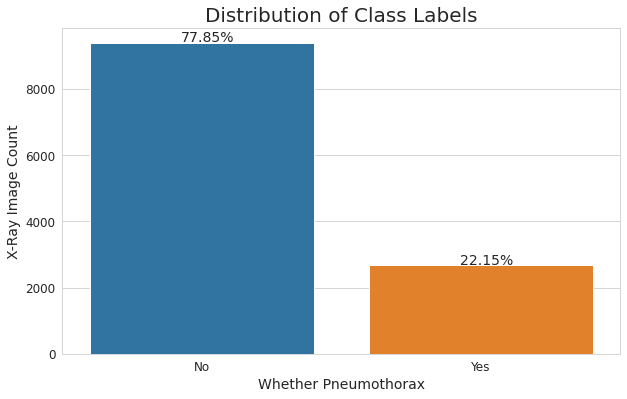

In [ ]:
# Check distribution of class labels i.e. Pneumothorax or not
plt.figure(figsize=(10,6))
sns.set_style('whitegrid')
ax = sns.countplot(x='Whether_Pneumothorax',data=train_df)
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.title('Distribution of Class Labels', fontsize=20)
plt.xlabel('Whether Pneumothorax', size = 14)
plt.ylabel('X-Ray Image Count', size = 14)
percentage_without_hue(ax, train_df['Whether_Pneumothorax'], 0.02,40,14)

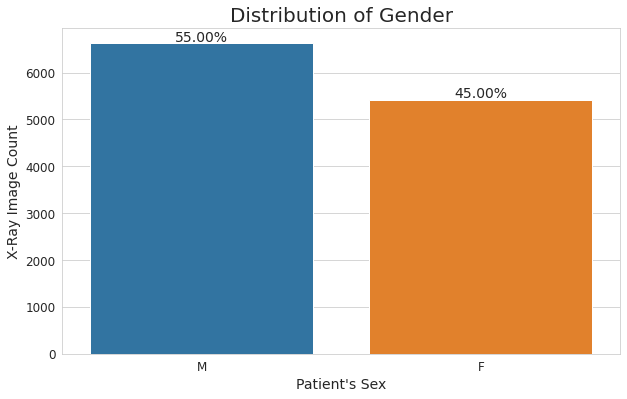

In [ ]:
# Check distribution of Gender
plt.figure(figsize=(10,6))
sns.set_style('whitegrid')
ax = sns.countplot(x='Sex',data=train_df)
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.title('Distribution of Gender', fontsize=20)
plt.xlabel('Patient\'s Sex', size = 14)
plt.ylabel('X-Ray Image Count', size = 14)
percentage_without_hue(ax, train_df['Sex'], 0,40,14)

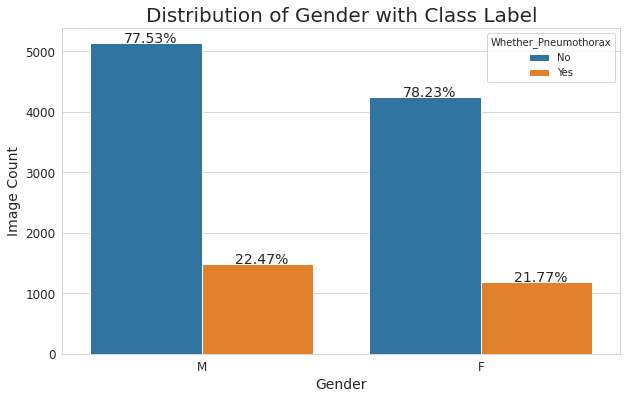

In [ ]:
# Distribution of Gender along with class label
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='Sex',data=train_df, hue = 'Whether_Pneumothorax')
plt.title('Distribution of Gender with Class Label', size = 20)
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.xlabel('Gender', size = 14)
plt.ylabel('Image Count', size = 14)
percentage_with_hue(ax, train_df['Sex'], 2,2,-0.08,10, 14)

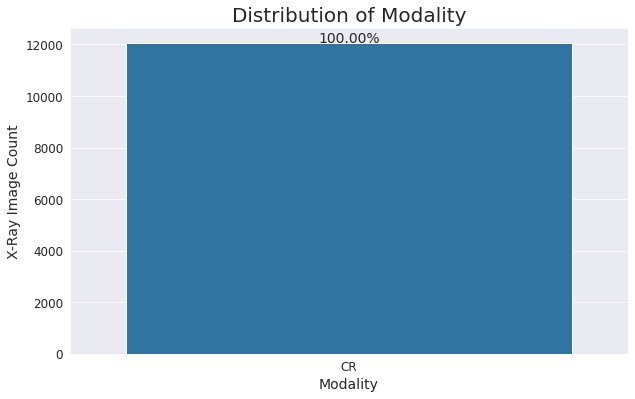

In [ ]:
# Check distribution of Modality
plt.figure(figsize=(10,6))
sns.set_style('darkgrid')
ax = sns.countplot(x='Modality',data=train_df)
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.title('Distribution of Modality', fontsize=20)
plt.xlabel('Modality', size = 14)
plt.ylabel('X-Ray Image Count', size = 14)
percentage_without_hue(ax, train_df['Modality'], 0,40,14)

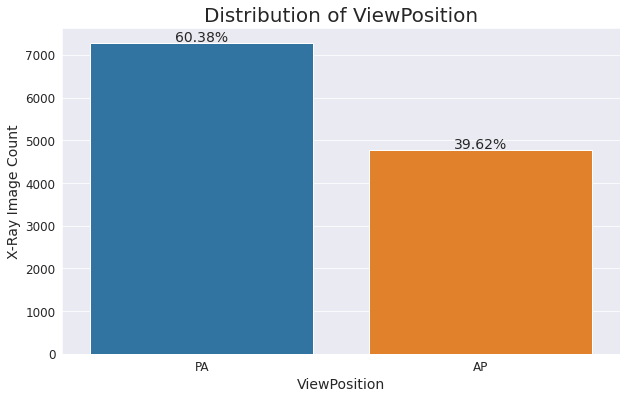

In [ ]:
# Check distribution of ViewPosition
plt.figure(figsize=(10,6))
sns.set_style('darkgrid')
ax = sns.countplot(x='ViewPosition',data=train_df)
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.title('Distribution of ViewPosition', fontsize=20)
plt.xlabel('ViewPosition', size = 14)
plt.ylabel('X-Ray Image Count', size = 14)
percentage_without_hue(ax, train_df['ViewPosition'], 0,40,14)

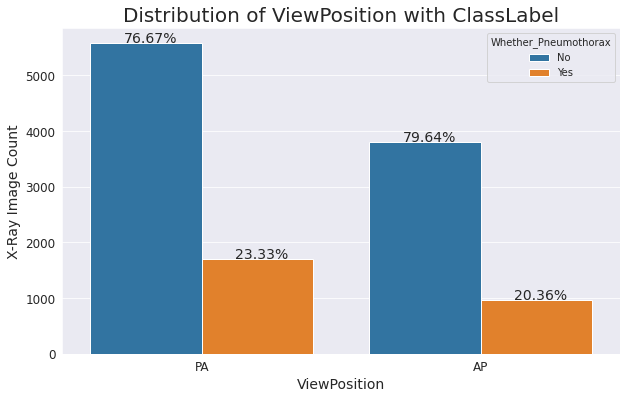

In [ ]:
# Distribution of ViewPosition with ClassLabel
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='ViewPosition',data=train_df, hue = 'Whether_Pneumothorax')
plt.title('Distribution of ViewPosition with ClassLabel', size = 20)
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.xlabel('ViewPosition', size = 14)
plt.ylabel('X-Ray Image Count', size = 14)
percentage_with_hue(ax, train_df['ViewPosition'], 2,2,-0.08,10, 14)

In [ ]:
#convert the Age column to int
train_df["Age"] = pd.to_numeric(train_df["Age"])

# sort the age of the patients in ascending order
sorted_ages = np.sort(train_df["Age"].values)
print(sorted_ages)

[  1   2   2 ...  94 148 413]


In [ ]:
# print last 10 ages to check if there is any abnormal behaviour
sorted_ages[-10:]

array([ 87,  88,  88,  89,  89,  89,  90,  94, 148, 413])

In [ ]:
for p in range(25,101,25):
    print(str(p)+"th = " + str(np.percentile(train_df["Age"], p)), end=" || ")

25th = 35.0 || 50th = 49.0 || 75th = 59.0 || 100th = 413.0 || 

In [ ]:
for p in range(90,101,1):
    print(str(p)+"th = " + str(np.percentile(train_df["Age"], p)), end=" || ")

90th = 67.0 || 91th = 68.0 || 92th = 69.0 || 93th = 70.0 || 94th = 71.0 || 95th = 72.0 || 96th = 73.0 || 97th = 74.0 || 98th = 76.0 || 99th = 79.0 || 100th = 413.0 || 

In [ ]:
for p in [99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100]:
  print(str(p)+"th = " + str(np.percentile(train_df["Age"], p)), end=" || ")

99.1th = 80.0 || 99.2th = 80.0 || 99.3th = 80.0 || 99.4th = 81.0 || 99.5th = 81.0 || 99.6th = 82.0 || 99.7th = 83.0 || 99.8th = 84.0 || 99.9th = 87.0 || 100th = 413.0 || 

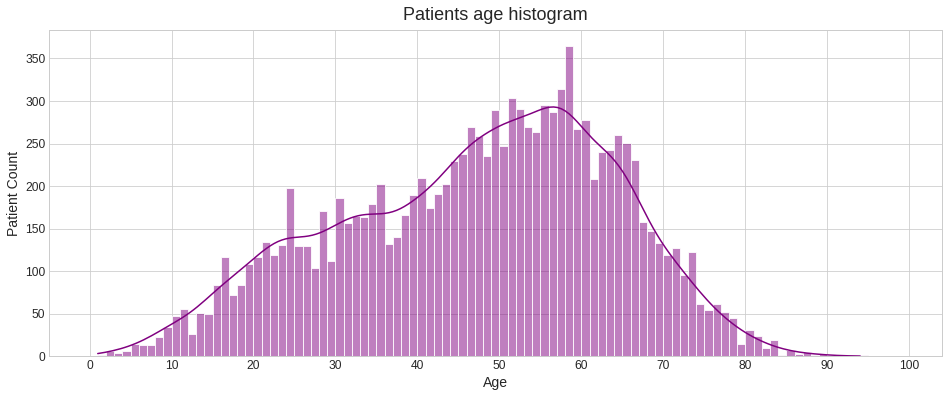

In [ ]:
import seaborn as sns
plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(16, 6))
# discard last 2 values as these are outliers
sns.histplot(sorted_ages[:-2], bins=[i for i in range(100)], kde=True, color ='purple')
plt.title("Patients age histogram", fontsize=18, pad=10)
plt.xticks([i for i in range(0,101,10)], size = 12)
plt.yticks(size = 12)
plt.xlabel("Age", fontsize=14)
plt.ylabel("Patient Count", fontsize=14)
plt.show()

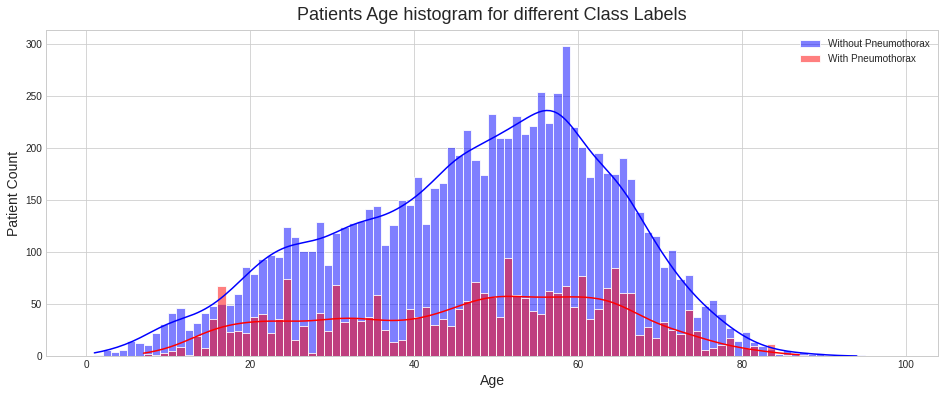

In [ ]:
plt.figure(figsize=(16, 6))
# consider the patient's age less than 120
sns.histplot( train_df[(train_df.Whether_Pneumothorax == 'No') & (train_df.Age <= 120)]['Age'], bins=[i for i in range(100)], color="blue", kde=True, label="Without Pneumothorax")
sns.histplot( train_df[(train_df.Whether_Pneumothorax == 'Yes') & (train_df.Age <= 120)]['Age'], bins=[i for i in range(100)], kde=True, color="red", label="With Pneumothorax")
plt.title("Patients Age histogram for different Class Labels", fontsize=18, pad=10)
plt.xlabel("Age", fontsize=14)
plt.ylabel("Patient Count", fontsize=14)
plt.legend()
plt.show()

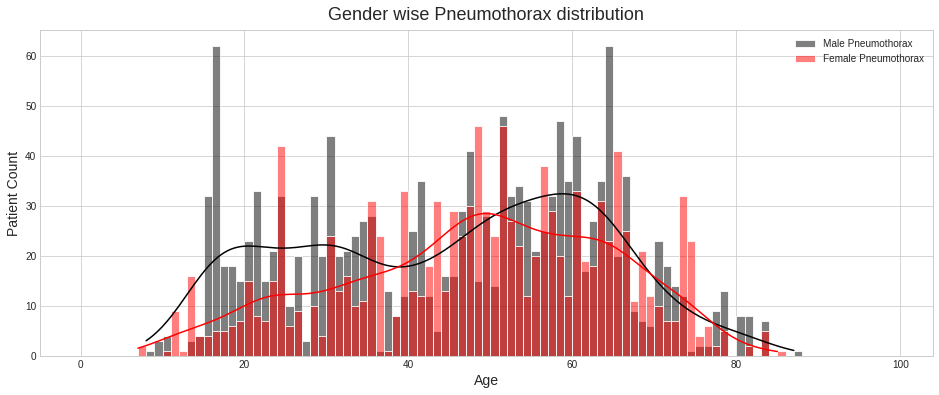

In [ ]:
# Gender wise Pneumothorax distribution
plt.figure(figsize=(16, 6))
sns.histplot( train_df[(train_df.Whether_Pneumothorax == 'Yes') & (train_df['Sex'] == 'M') & (train_df.Age <= 120)]['Age'], color="black", bins=[i for i in range(100)], kde=True, label="Male Pneumothorax")
sns.histplot( train_df[(train_df.Whether_Pneumothorax == 'Yes') & (train_df['Sex'] == 'F') & (train_df.Age <= 120)]['Age'], color="red", bins=[i for i in range(100)], kde=True, label="Female Pneumothorax")
plt.title("Gender wise Pneumothorax distribution", fontsize=18, pad=10)
plt.xlabel("Age", fontsize=14)
plt.ylabel("Patient Count", fontsize=14)
plt.legend()
plt.show()

In [ ]:
# create 2 separate directories for train and test png images
train_images_png = './train_images_png/'
test_images_png = './test_images_png/'

if not os.path.isdir(train_images_png):
    os.makedirs(train_images_png)
if not os.path.isdir(test_images_png):
    os.makedirs(test_images_png)

In [ ]:
# Define function to convert dicom images to png
def convert_images_to_png(filename, outdir):
  ds = pydicom.read_file(str(filename))
  img = ds.pixel_array
  img = cv2.resize(img, (256, 256))
  cv2.imwrite(outdir + filename.split('/')[-1][:-4] + '.png', img)

In [ ]:
for file in tqdm(train_df['Image_Path']):
  convert_images_to_png(file, train_images_png)

100%|██████████| 12047/12047 [02:04<00:00, 97.04it/s] 


In [ ]:
for file in tqdm(test_df['Image_Path']):
  convert_images_to_png(file, test_images_png)

100%|██████████| 3205/3205 [00:33<00:00, 94.43it/s]


In [ ]:
# Define function to convert RLE to mask, provided by organizers
def rle2mask(rle, width, height):
    mask= np.zeros(width* height)
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]

    current_position = 0
    for index, start in enumerate(starts):
        current_position += start
        mask[current_position:current_position+lengths[index]] = 1
        current_position += lengths[index]

    return mask.reshape(width, height)

In [ ]:
train_df.iloc[20:30]

,ImageId,EncodedPixels,Image_Path,Age,Sex,Modality,BodyPart,ViewPosition,Whether_Pneumothorax
20,1.2.276.0.7230010.3.1.4.8323329.32060.15178751...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,29,M,CR,CHEST,PA,No
21,1.2.276.0.7230010.3.1.4.8323329.11391.15178752...,618697 45 974 53 969 55 966 59 963 61 962 62 9...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,20,F,CR,CHEST,PA,Yes
22,1.2.276.0.7230010.3.1.4.8323329.14520.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,67,F,CR,CHEST,PA,No
23,1.2.276.0.7230010.3.1.4.8323329.11541.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,44,F,CR,CHEST,AP,No
24,1.2.276.0.7230010.3.1.4.8323329.32561.15178751...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,61,F,CR,CHEST,PA,No
25,1.2.276.0.7230010.3.1.4.8323329.12598.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,30,F,CR,CHEST,PA,No
26,1.2.276.0.7230010.3.1.4.8323329.12084.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,24,F,CR,CHEST,PA,No
27,1.2.276.0.7230010.3.1.4.8323329.10251.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,51,F,CR,CHEST,PA,No
28,1.2.276.0.7230010.3.1.4.8323329.6873.151787520...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,80,M,CR,CHEST,AP,No
29,1.2.276.0.7230010.3.1.4.8323329.1857.151787516...,378999 2 1018 8 1013 13 1009 15 1007 17 1006 1...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,78,F,CR,CHEST,AP,Yes


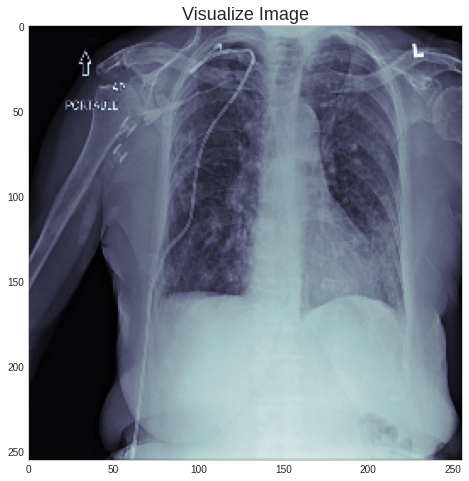

In [ ]:
# plot original image
plt.figure(figsize=(8,8))
image_row = 29
# read the original image
ds = pydicom.read_file(train_df['Image_Path'][image_row])
img = cv2.resize(ds.pixel_array, (256, 256))
plt.imshow(img, cmap=plt.cm.bone)
plt.title("Visualize Image", fontsize=18)
plt.grid(False)
plt.show()

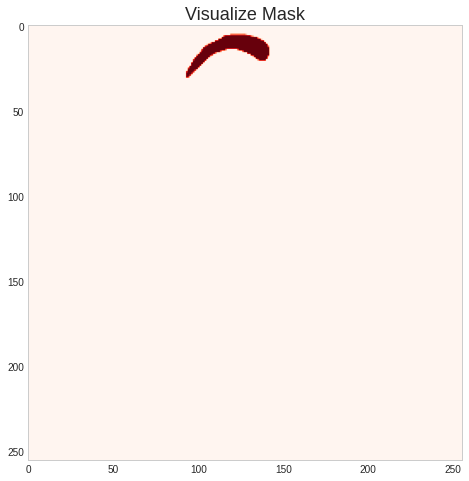

In [ ]:
# plot mask
plt.figure(figsize=(8,8))
image_bytes = rle2mask(train_df['EncodedPixels'][image_row], 1024, 1024).T
image_bytes = cv2.resize(image_bytes, (256, 256))
plt.imshow(image_bytes, cmap='Reds', alpha=1)
plt.title("Visualize Mask", fontsize=18)
plt.grid(False)
plt.show()

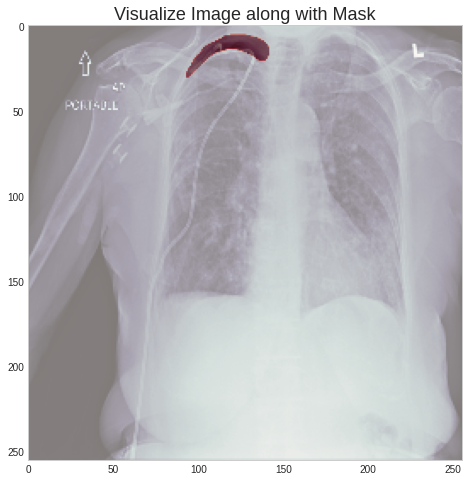

In [ ]:
# Visualize Image along with it's Mask
plt.figure(figsize=(8,8))
plt.imshow(image_bytes, cmap='Reds')
plt.imshow(img, cmap=plt.cm.bone, alpha=0.5)
plt.title("Visualize Image along with Mask", fontsize=18)
plt.grid(False)
plt.show()

In [ ]:
# Create Directories for mask png files
train_mask_png = './train_mask_png/'
# test_mask_png = 'siim/test_mask_png'

if not os.path.isdir(train_mask_png):
    os.makedirs(train_mask_png)
# if not os.path.isdir(test_mask_png):
#     os.makedirs(test_mask_png)

In [ ]:
def convert_images_to_png(filename, outdir):
  ds = pydicom.read_file(str(filename))
  img = ds.pixel_array
  img = cv2.resize(img, (256, 256))
  cv2.imwrite(outdir + filename.split('/')[-1][:-4] + '.png', img)

In [ ]:

# define function to convert mask to png image
def convert_masks_to_png(data, outdir):
  for img_id, enc_pix in tqdm(data.values):
    mask_path = outdir + str(img_id) + '_mask.png'
    # print(mask_path)
    if enc_pix != "-1":
      image_bytes = rle2mask(enc_pix, 1024, 1024).T
      mask = cv2.resize(image_bytes, (256, 256))
      cv2.imwrite(mask_path, mask)
    else:
      mask = np.zeros((256, 256), dtype=np.uint8)
      cv2.imwrite(mask_path, mask)
convert_masks_to_png(train_df[['ImageId', 'EncodedPixels']], train_mask_png)

100%|██████████| 12047/12047 [00:18<00:00, 655.00it/s]


In [ ]:
# create a dataframe containing full image path and mask path
train_image_mask_df = pd.DataFrame(columns = ['ImageId', 'Image_Path', 'Mask_Path'])
for img_id in tqdm(train_df['ImageId']):
  # print(img_id)
  image_path = train_images_png + str(img_id) + '.png'
  mask_path = train_mask_png + str(img_id) + '_mask.png'
  # print(image_path)
  # print(mask_path)
  train_image_mask_df = train_image_mask_df.append({'ImageId':img_id, 'Image_Path':image_path, 'Mask_Path':mask_path}, ignore_index = True)

train_image_mask_df.head()

100%|██████████| 12047/12047 [00:41<00:00, 292.86it/s]


,ImageId,Image_Path,Mask_Path
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...


In [ ]:
train_image_mask_df.head(20)

,ImageId,Image_Path,Mask_Path
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
5,1.2.276.0.7230010.3.1.4.8323329.11444.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
6,1.2.276.0.7230010.3.1.4.8323329.32219.15178751...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
7,1.2.276.0.7230010.3.1.4.8323329.32395.15178751...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
8,1.2.276.0.7230010.3.1.4.8323329.10623.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...
9,1.2.276.0.7230010.3.1.4.8323329.12095.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...


In [ ]:
test_image_df = pd.DataFrame(columns = ['ImageId', 'Image_Path'])
for img_id in tqdm(test_df['ImageId']):
  image_path = test_images_png + str(img_id) + '.png'
  test_image_df = test_image_df.append({'ImageId':img_id, 'Image_Path':image_path}, ignore_index = True)
  
test_image_df.head()

100%|██████████| 3205/3205 [00:09<00:00, 327.21it/s]


,ImageId,Image_Path
0,ID_708984b8c,./test_images_png/ID_708984b8c.png
1,ID_dffca7dc0,./test_images_png/ID_dffca7dc0.png
2,ID_0e0ebf53a,./test_images_png/ID_0e0ebf53a.png
3,ID_6eb1941d0,./test_images_png/ID_6eb1941d0.png
4,ID_9cc7afaba,./test_images_png/ID_9cc7afaba.png


In [ ]:
test_image_df.head(20)

,ImageId,Image_Path
0,ID_708984b8c,./test_images_png/ID_708984b8c.png
1,ID_dffca7dc0,./test_images_png/ID_dffca7dc0.png
2,ID_0e0ebf53a,./test_images_png/ID_0e0ebf53a.png
3,ID_6eb1941d0,./test_images_png/ID_6eb1941d0.png
4,ID_9cc7afaba,./test_images_png/ID_9cc7afaba.png
5,ID_c8243f1a5,./test_images_png/ID_c8243f1a5.png
6,ID_2d93d1e24,./test_images_png/ID_2d93d1e24.png
7,ID_85545856a,./test_images_png/ID_85545856a.png
8,ID_d98e1e389,./test_images_png/ID_d98e1e389.png
9,ID_bc4dd4d40,./test_images_png/ID_bc4dd4d40.png


In [ ]:
train_image_mask_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12047 entries, 0 to 12046
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   ImageId     12047 non-null  object
 1   Image_Path  12047 non-null  object
 2   Mask_Path   12047 non-null  object
dtypes: object(3)
memory usage: 282.5+ KB


In [ ]:
# create a dataframe containing full image path and mask path
train_image_mask_df = pd.DataFrame(columns = ['ImageId', 'Image_Path', 'Mask_Path', 'is_pneumothorax'])
for i in tqdm(range(len(train_df))):
  img_id = train_df['ImageId'].iloc[i]
  is_ptx = train_df['Whether_Pneumothorax'].iloc[i]
  # print(img_id)
  image_path = train_images_png + str(img_id) + '.png'
  mask_path = train_mask_png + str(img_id) + '_mask.png'
  # print(image_path)
  # print(mask_path)
  train_image_mask_df = train_image_mask_df.append({'ImageId':img_id, 'Image_Path':image_path, 'Mask_Path':mask_path, 'is_pneumothorax':is_ptx}, ignore_index = True)

train_image_mask_df.head()

100%|██████████| 12047/12047 [00:45<00:00, 266.10it/s]


,ImageId,Image_Path,Mask_Path,is_pneumothorax
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...,No
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...,Yes
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...,No
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...,Yes
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,./train_images_png/1.2.276.0.7230010.3.1.4.832...,./train_mask_png/1.2.276.0.7230010.3.1.4.83233...,Yes


In [ ]:
train_image_mask_df.is_pneumothorax.value_counts()

No     9378
Yes    2669
Name: is_pneumothorax, dtype: int64

In [ ]:
train_df['Whether_Pneumothorax'].value_counts()

No     9378
Yes    2669
Name: Whether_Pneumothorax, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_val = train_test_split(train_image_mask_df[['Image_Path', 'Mask_Path']], stratify=train_image_mask_df.is_pneumothorax, test_size=0.15, random_state=42)

print(x_train.shape)
print(x_val.shape)

(10239, 2)
(1808, 2)


In [ ]:
from glob import glob
import shutil
import argparse
import zipfile
import hashlib
import requests
from tqdm import tqdm
import IPython.display as display
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import datetime, os
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from IPython.display import clear_output
# import tensorflow_addons as tfa

# For more information about autotune:
# https://www.tensorflow.org/guide/data_performance#prefetching
AUTOTUNE = tf.data.experimental.AUTOTUNE
print(f"Tensorflow ver. {tf.__version__}")

Tensorflow ver. 2.6.0


In [ ]:
pip install tensorflow.io

     |████████████████████████████████| 22.7 MB 1.6 MB/s 
     |████████████████████████████████| 2.1 MB 34.5 MB/s 


In [ ]:
def read_decode_image(image_path):
  # image_path = image_mask_path['image_path']
  # mask_path = image_mask_path['mask_path']
  image = tf.io.read_file(image_path)
  image = tf.image.decode_png(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  return image
  
def read_decode_mask(mask_path):
  mask = tf.io.read_file(mask_path)
  mask = tf.image.decode_png(mask, channels=1)
  mask = tf.image.convert_image_dtype(mask, tf.float32)
  # return {'image_file': image, 'mask_file': mask}
  return mask

In [ ]:
SEED = 42
train_image = tf.data.Dataset.list_files(x_train['Image_Path'], seed=SEED)
train_image = train_image.map(read_decode_image)

train_mask = tf.data.Dataset.list_files(x_train['Mask_Path'], seed=SEED)
train_mask = train_mask.map(read_decode_mask)

train_dataset = (train_image, train_mask)

val_image = tf.data.Dataset.list_files(x_train['Image_Path'], seed=SEED)
val_image = val_image.map(read_decode_image)

val_mask = tf.data.Dataset.list_files(x_val['Mask_Path'], seed=SEED)
val_mask = val_mask.map(read_decode_mask)

val_dataset = (val_image, val_mask)

In [ ]:
train_dataset, val_dataset

((<MapDataset shapes: (None, None, 3), types: tf.float32>,
  <MapDataset shapes: (None, None, 1), types: tf.float32>),
 (<MapDataset shapes: (None, None, 3), types: tf.float32>,
  <MapDataset shapes: (None, None, 1), types: tf.float32>))

In [ ]:
def load_image_train(x, y):
  input_image = tf.image.resize(x, (IMG_SIZE, IMG_SIZE))
  input_mask = tf.image.resize(y, (IMG_SIZE, IMG_SIZE))

  # apply augmentation in train daya only
  random_value = tf.random.uniform(())
  if random_value > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    input_mask = tf.image.flip_left_right(input_mask)

  return input_image, input_mask

def load_image_val(x, y):
  input_image = tf.image.resize(x, (IMG_SIZE, IMG_SIZE))
  input_mask = tf.image.resize(y, (IMG_SIZE, IMG_SIZE))

  return input_image, input_mask

In [ ]:
def preprocess_image_mask(x, y):
  decoded_image = read_decode_image(x)
  decoded_mask = read_decode_mask(y)

  return decoded_image, decoded_mask

In [ ]:
BATCH_SIZE = 5
BUFFER_SIZE = 1000
IMG_SIZE = 256
SEED = 42

x = x_train['Image_Path']
y = x_train['Mask_Path']
# Train Dataset
dataset_train = tf.data.Dataset.from_tensor_slices((x, y))
dataset_train = dataset_train.map(lambda x, y: preprocess_image_mask(x, y), num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset_train = dataset_train.map(lambda x, y: load_image_train(x, y), num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset_train = dataset_train.shuffle(buffer_size=BUFFER_SIZE, seed=SEED)
dataset_train = dataset_train.repeat()
dataset_train = dataset_train.batch(BATCH_SIZE)
dataset_train = dataset_train.prefetch(buffer_size=AUTOTUNE)
print(dataset_train)

<PrefetchDataset shapes: ((None, 256, 256, 3), (None, 256, 256, 1)), types: (tf.float32, tf.float32)>


In [ ]:
x = x_val['Image_Path']
y = x_val['Mask_Path']
# Validation Dataset
dataset_val = tf.data.Dataset.from_tensor_slices((x, y))
dataset_val = dataset_val.map(lambda x, y: preprocess_image_mask(x, y), num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset_val = dataset_val.map(lambda x, y: load_image_val(x, y), num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset_val = dataset_val.shuffle(buffer_size=BUFFER_SIZE, seed=SEED)
dataset_val = dataset_val.repeat()
dataset_val = dataset_val.batch(BATCH_SIZE)
dataset_val = dataset_val.prefetch(buffer_size=AUTOTUNE)
print(dataset_val)

<PrefetchDataset shapes: ((None, 256, 256, 3), (None, 256, 256, 1)), types: (tf.float32, tf.float32)>


In [ ]:
def display_sample(display_list):
    """Show side-by-side an input image,
    the ground truth and the prediction.
    """
    plt.figure(figsize=(18, 18))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

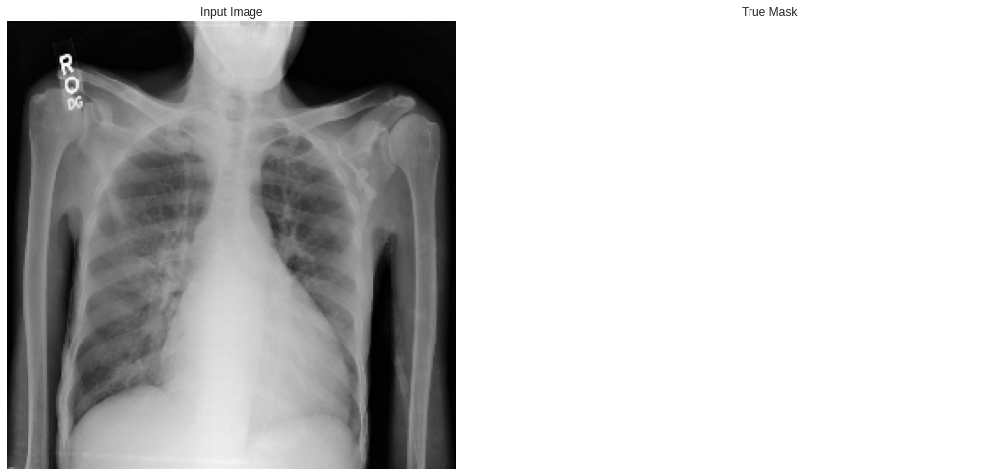

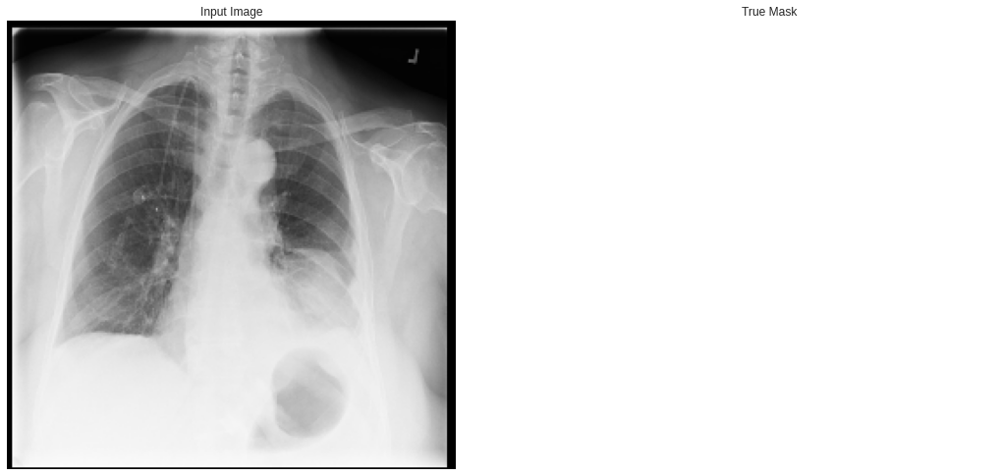

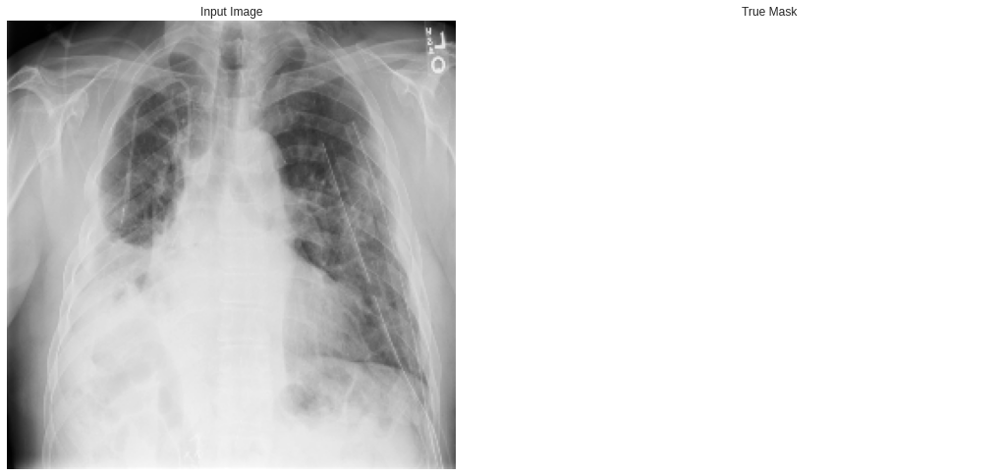

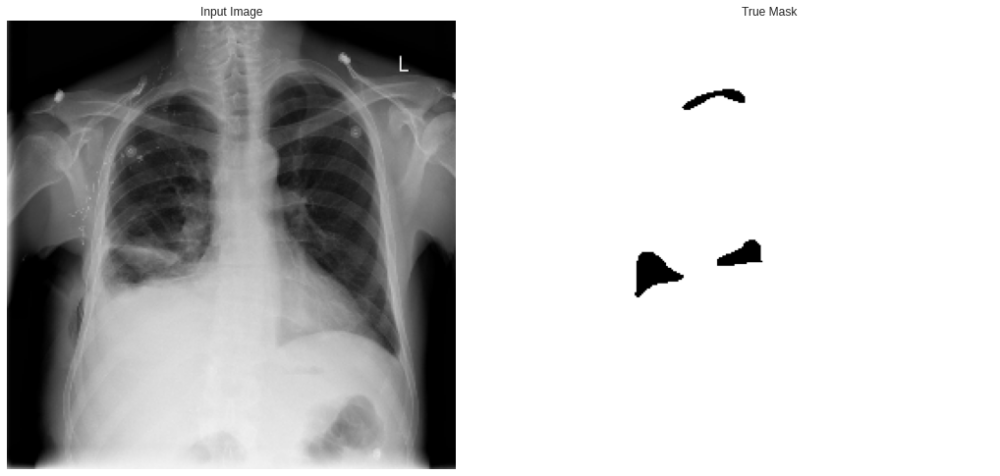

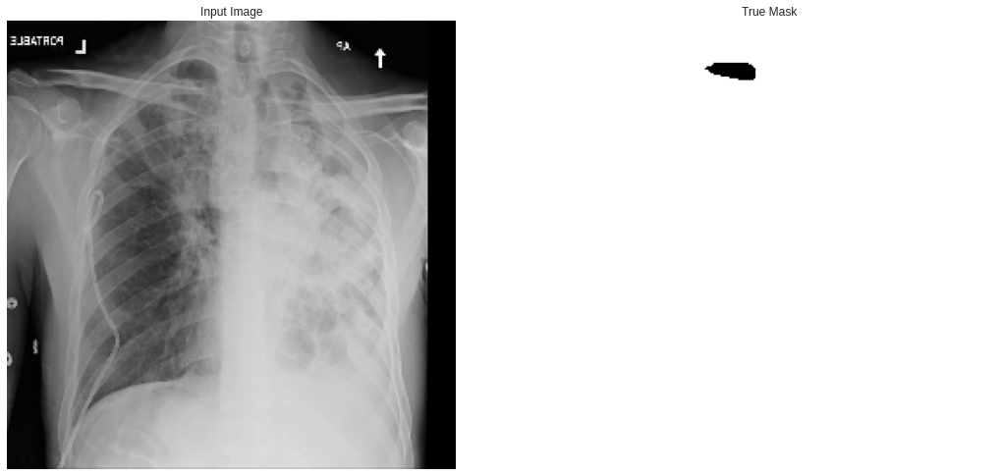

...

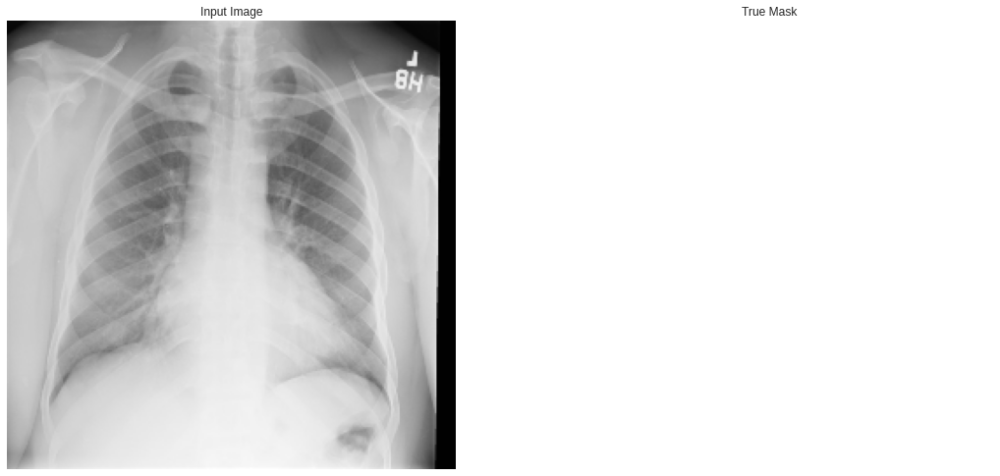

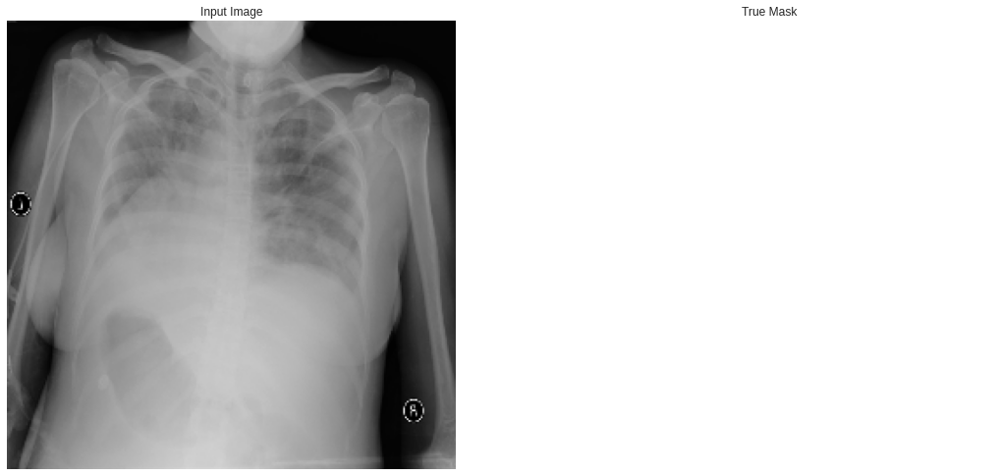

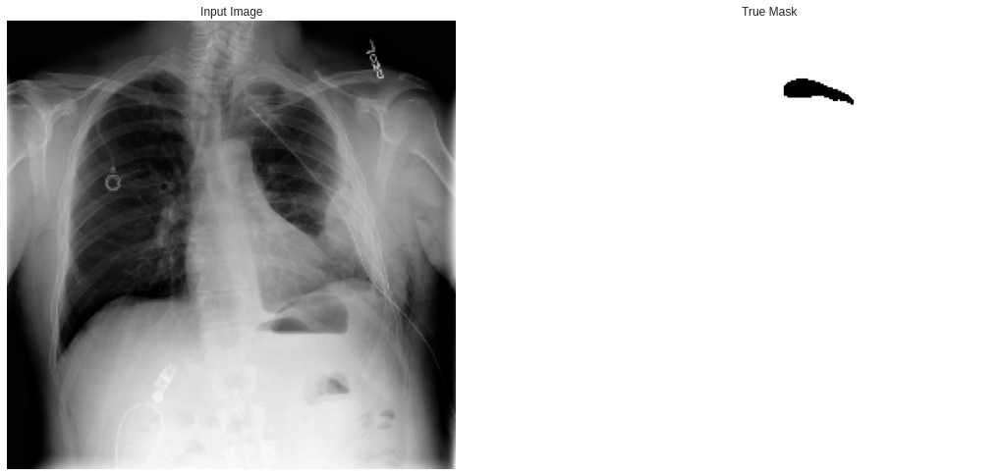

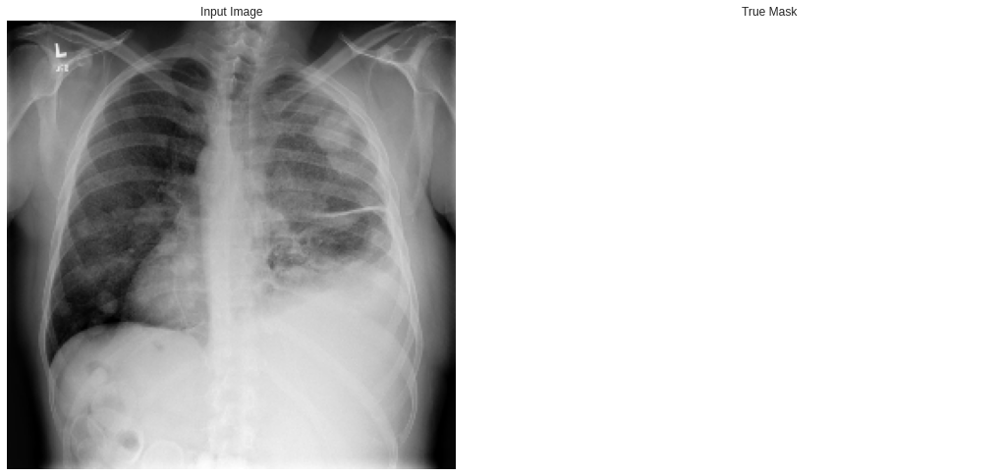

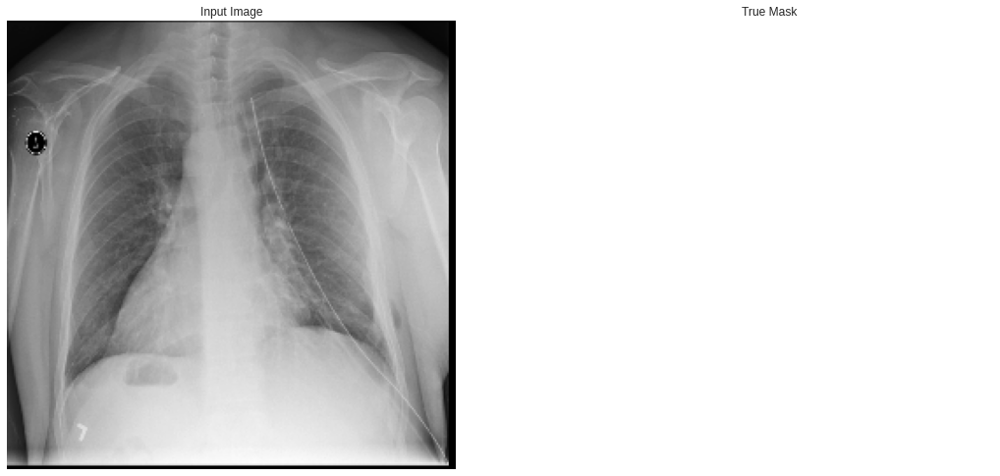

In [ ]:
for image, mask in dataset_train.take(50):
  sample_image, sample_mask = image, mask
  display_sample([sample_image[0], sample_mask[0]])

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import datetime as dt
from datetime import datetime
from tqdm import tqdm
from glob import glob
import pandas as pd
import shutil
import glob2

In [ ]:
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Activation, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import *
from tensorflow.keras.layers import *
import datetime
from sklearn.model_selection import train_test_split

In [ ]:
import tensorflow as tf
!pip install --user tensorflow-io
!pip install pydicom
import tensorflow_io as tfio

In [ ]:
!cp -r /content/siimdataset/pneomx/SIIM_TRAIN_TEST_2/train-rle.csv ./

In [ ]:
image_df = pd.read_csv('./train-rle.csv')

In [ ]:
image_df.head(10)

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,-1
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,557374 2 1015 8 1009 14 1002 20 997 26 990 32 ...
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,-1
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,514175 10 1008 29 994 30 993 32 991 33 990 34 ...
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,592184 33 976 58 956 73 941 88 926 102 917 109...
5,1.2.276.0.7230010.3.1.4.8323329.11444.15178752...,-1
6,1.2.276.0.7230010.3.1.4.8323329.32219.15178751...,-1
7,1.2.276.0.7230010.3.1.4.8323329.32395.15178751...,-1
8,1.2.276.0.7230010.3.1.4.8323329.10623.15178752...,-1
9,1.2.276.0.7230010.3.1.4.8323329.12095.15178752...,-1


In [ ]:
image_df.describe()

,ImageId,EncodedPixels
count,12954,12954
unique,12047,3577
top,1.2.276.0.7230010.3.1.4.8323329.1851.151787516...,-1
freq,10,9378


In [ ]:
#drop the duplicate ImageIDs
image_df.drop_duplicates(subset="ImageId", keep='first', inplace = True)

In [ ]:
image_df = pd.read_csv('train_dicom_imageid_path.csv')

In [ ]:
image_df.head()

,ImageId,EncodedPixels,Image_Path
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,557374 2 1015 8 1009 14 1002 20 997 26 990 32 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,514175 10 1008 29 994 30 993 32 991 33 990 34 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,592184 33 976 58 956 73 941 88 926 102 917 109...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...


In [ ]:
image_df.rename(columns = {' EncodedPixels':'EncodedPixels'}, inplace = True)
# add a column whether the image is with pneumothorax or without pneumothorax
image_df['Whether_Pneumothorax'] = np.where(image_df['EncodedPixels']=='-1', 0, 1)
image_df.head(10)

,ImageId,EncodedPixels,Image_Path,Whether_Pneumothorax
0,1.2.276.0.7230010.3.1.4.8323329.6904.151787520...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0
1,1.2.276.0.7230010.3.1.4.8323329.13666.15178752...,557374 2 1015 8 1009 14 1002 20 997 26 990 32 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,1
2,1.2.276.0.7230010.3.1.4.8323329.11028.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0
3,1.2.276.0.7230010.3.1.4.8323329.10366.15178752...,514175 10 1008 29 994 30 993 32 991 33 990 34 ...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,1
4,1.2.276.0.7230010.3.1.4.8323329.10016.15178752...,592184 33 976 58 956 73 941 88 926 102 917 109...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,1
5,1.2.276.0.7230010.3.1.4.8323329.11444.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0
6,1.2.276.0.7230010.3.1.4.8323329.32219.15178751...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0
7,1.2.276.0.7230010.3.1.4.8323329.32395.15178751...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0
8,1.2.276.0.7230010.3.1.4.8323329.10623.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0
9,1.2.276.0.7230010.3.1.4.8323329.12095.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0


In [ ]:
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(image_df, test_size=0.2, random_state=42, stratify=image_df['Whether_Pneumothorax'], shuffle=True)

In [ ]:

# Define a function to read and decode dicom image
def decode_image(image_path, label, size=256):
  # read the image from image_path
  image = tf.io.read_file(image_path)
  # convert the image into a 3D tensor
  image = tfio.image.decode_dicom_image(image, dtype=tf.uint8,color_dim=True,scale='preserve')
  # convert image datatype to float32
  image = tf.image.convert_image_dtype(image, tf.float32)
  # squeeze the image from shape (1,1024,1024,1) to (1024,1024,1)
  image =tf.squeeze(image,[0])
  # using tf.tile convert image shape (1024,1024,1) tp (1024,1024,3)
  image=tf.tile(image, tf.constant([1,1,3], tf.int32))
  # resize the image
  image=tf.image.resize(image,size=[size,size])
  # return image and corresponding label
  return image, label

In [ ]:
# Define a function to augment image
def augment_image(image, label):
  a = np.random.uniform()
  if a<0.2:
      image = tf.image.random_flip_left_right(image)
  elif a<0.4:
      image = tf.image.random_flip_up_down(image)
  elif a<0.6:
      image = tf.image.random_brightness(image, 0.3)
  elif a<0.8:
      image = tf.image.random_contrast(image,lower=0.2,upper=0.3)
  else:
      image = tf.image.random_saturation(image, lower=2, upper=5)
  return image, label

In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
def train_generator(image_path, image_label):
  # creating a dataset from tensor slices
  dataset = tf.data.Dataset.from_tensor_slices((image_path, image_label))
  # shuffle the dataset
  dataset = dataset.shuffle(len(image_path), seed=42)
  # decode image using decode_image function
  dataset = dataset.map(decode_image, num_parallel_calls=AUTOTUNE)
  # augment image using augment_image function
  dataset = dataset.map(augment_image, num_parallel_calls=AUTOTUNE)
  return dataset

def val_generator(image_path, image_label):
  # creating a dataset from tensor slices
  dataset = tf.data.Dataset.from_tensor_slices((image_path, image_label))
  # shuffle the dataset
  dataset = dataset.shuffle(len(image_path), seed=42)
  # decode image using decode_image function
  dataset = dataset.map(decode_image, num_parallel_calls=AUTOTUNE)
  return dataset 

In [ ]:
#separate image path and image label from train_df and val_df
train_image_path = train_df['Image_Path'].values
train_image_label = train_df['Whether_Pneumothorax'].values
val_image_path = train_df['Image_Path'].values
val_image_label = train_df['Whether_Pneumothorax'].values

In [ ]:
train_dataset = train_generator(train_image_path, train_image_label)
val_dataset = val_generator(val_image_path, val_image_label)
train_dataset, val_dataset

(<ParallelMapDataset shapes: ((256, 256, None), ()), types: (tf.float32, tf.int64)>,
 <ParallelMapDataset shapes: ((256, 256, None), ()), types: (tf.float32, tf.int64)>)

In [ ]:
# batch the train and validation dataset
batch_size = 64
train_ds_batch = train_dataset.batch(batch_size, drop_remainder=True)
val_ds_batch = val_dataset.batch(batch_size, drop_remainder=True)
train_ds_batch, val_ds_batch


(<BatchDataset shapes: ((64, 256, 256, None), (64,)), types: (tf.float32, tf.int64)>,
 <BatchDataset shapes: ((64, 256, 256, None), (64,)), types: (tf.float32, tf.int64)>)

100%|██████████| 10/10 [00:00<00:00, 10.58it/s]


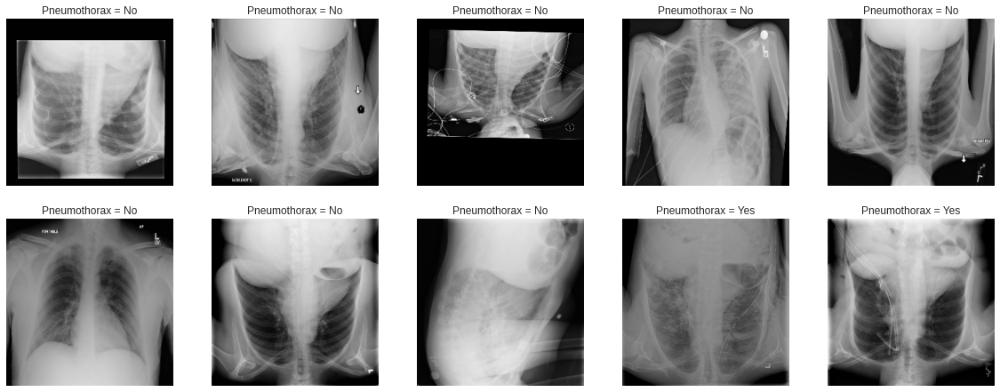

In [ ]:
# plot some random images from train_dataset
plt.figure(figsize=(20,20))
count=0
for i,j in tqdm(train_dataset.take(10)):
  ax = plt.subplot(5,5,count+1)
  count=count+1
  if j==0:
    # if the image label=0, then print "Pneumothorax = No"
    plt.title("Pneumothorax = No")
  else:
    # otherwise(image label=1) print "Pneumothorax = Yes"
    plt.title("Pneumothorax = Yes")
  plt.imshow(i)
  plt.axis("off")


In [ ]:
# https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.models import Model, load_model
from keras.applications.vgg16 import VGG16
tf.keras.backend.clear_session()
# use VGG16 model with imagenet weights
model_vgg16 = VGG16(weights = "imagenet", include_top=False, input_shape = (256,256,3))
# set all the layers trainable = False
for i in tqdm(model_vgg16.layers):
  i.trainable=False


58900480/58889256 [==============================] - 1s 0us/step


100%|██████████| 19/19 [00:00<00:00, 16682.39it/s]


In [ ]:
# define model architecture
model = model_vgg16.output
model = Conv2D(32, (3, 3))(model)
model = (Activation('relu'))(model)
model = (MaxPool2D(pool_size=(2, 2)))(model)
model = Flatten()(model)
model = Dense(256, activation="relu")(model)
# model= tf.keras.layers.Dropout(0.2)(model)
model = Dense(128, activation="relu")(model)
output_layer = Dense(1, activation="sigmoid")(model)
model_1 = Model(model_vgg16.input,output_layer)


In [ ]:
# print model summary
model_1.summary()


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0     

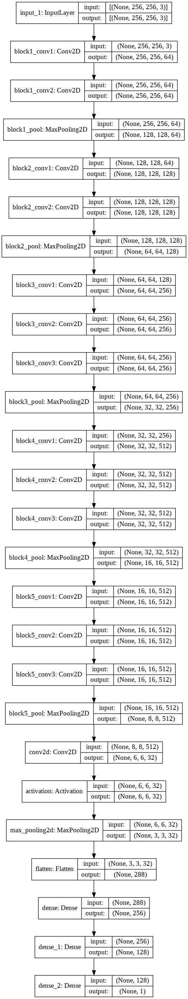

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model_1, 'model_1.png', show_shapes=True)

In [ ]:
# set filepath to save best models
filepath="gdrive/My Drive/Colab Notebooks/cs2_pneumothorax/classification/weights-{epoch:02d}-{val_recall:.4f}.hdf5"
model_checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_recall', verbose=1, save_best_only=True, mode='max')
# earlystop
from tensorflow.keras.callbacks import EarlyStopping
earlystop = EarlyStopping(monitor='val_accuracy', min_delta=0.001, mode='max', patience=4, verbose=1,
restore_best_weights=True)


In [ ]:
# callback to stop training when desired recall is reached
# https://towardsdatascience.com/neural-network-with-tensorflow-how-to-stop-training-using-callback-5c8d575c18a9
class myCallback(tf.keras.callbacks.Callback):
  def __init__(self, threshold):
    super(myCallback, self).__init__()
    self.threshold = threshold
 
  def on_epoch_end(self, epoch, logs={}):
      if(logs.get('val_recall') > self.threshold):
        print("Trainning Stopped. Val Recall = {} crossed threshold = {}".format(logs.get('val_recall'), self.threshold))
        self.model.stop_training = True


In [ ]:
#%rm -rf ./log
#%load_ext tensorboard
#%tensorboard --logdir='./log'
#%reload_ext tensorboard
#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir='./log')
adam = tf.keras.optimizers.Adam(lr=0.0001)
precision = tf.keras.metrics.Precision(name='precision')
recall = tf.keras.metrics.Recall(name='recall')
callback_list = [model_checkpoint, myCallback(threshold=0.99)] #tensorboard_callback]
model_1.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["accuracy", recall, precision])
history = model_1.fit(train_ds_batch, epochs=20,verbose=1,validation_data=val_ds_batch,batch_size=64,callbacks=callback_list)

Epoch 1/20
150/150 [==============================] - 837s 5s/step - loss: 0.5066 - accuracy: 0.7790 - recall: 0.0024 - precision: 0.8333 - val_loss: 0.4604 - val_accuracy: 0.7809 - val_recall: 0.0301 - val_precision: 0.6038

Epoch 00001: val_recall improved from -inf to 0.03012, saving model to gdrive/My Drive/Colab Notebooks/cs2_pneumothorax/classification/weights-01-0.0301.hdf5
Epoch 2/20
150/150 [==============================] - 794s 5s/step - loss: 0.4503 - accuracy: 0.7873 - recall: 0.1382 - precision: 0.5857 - val_loss: 0.4153 - val_accuracy: 0.8033 - val_recall: 0.2284 - val_precision: 0.6639

Epoch 00002: val_recall improved from 0.03012 to 0.22838, saving model to gdrive/My Drive/Colab Notebooks/cs2_pneumothorax/classification/weights-02-0.2284.hdf5
Epoch 3/20
150/150 [==============================] - 796s 5s/step - loss: 0.4207 - accuracy: 0.8033 - recall: 0.2625 - precision: 0.6330 - val_loss: 0.4066 - val_accuracy: 0.8061 - val_recall: 0.1997 - val_precision: 0.7290

Epo

In [ ]:
#print ("Apachi Tomcat...")
#print ("Apachi Tomcat Wizard...")
#print ("Apachi Tomcat...")
#print ("Apachi Tomcat Lizard...")
#print ("Check network...")
#print ("Check permission...")
#print ("Continue...")
#print ("Finish...")

In [ ]:
# list all data in history
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'recall', 'precision', 'val_loss', 'val_accuracy', 'val_recall', 'val_precision'])


In [ ]:
import matplotlib.pyplot as plt

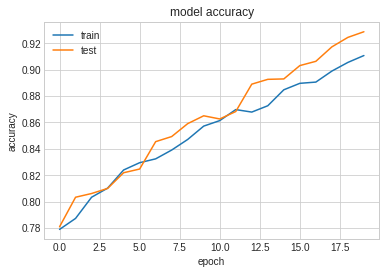

In [ ]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


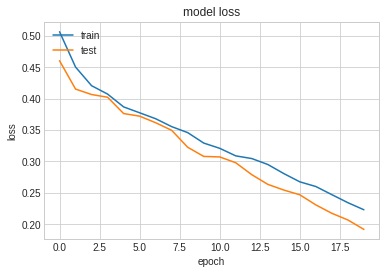

In [ ]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

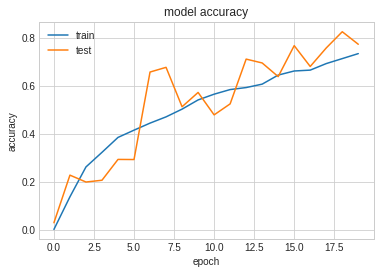

In [ ]:
# summarize history for recall
plt.plot(history.history['recall'])
plt.plot(history.history['val_recall'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

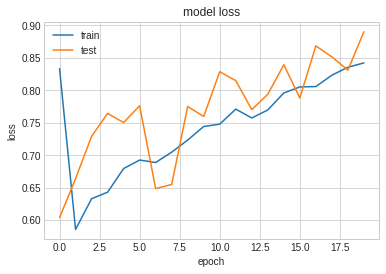

In [ ]:
# summarize history for precision
plt.plot(history.history['precision'])
plt.plot(history.history['val_precision'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
#load best weights to model_1
from keras.models import load_model
model_1 = load_model("/content/gdrive/MyDrive/Colab Notebooks/cs2_pneumothorax/classification/weights-19-0.8256.hdf5")

In [ ]:
from sklearn.metrics import confusion_matrix
#define function to plot a confusion matrix
def conf_matrix(test_y, predict_y):
  labels = [0,1]
  plt.figure(figsize=(8,6))
  C = confusion_matrix(test_y, predict_y)
  sns.heatmap(C, annot=True, fmt='d')
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.title('Pneomothorax Confusion Matrix')
  plt.show()

In [ ]:
#classify the images based on th probability score
#initialize an empty list to store the predicted label
val_pred_list = []
for file in tqdm(val_image_path):
  #preprocess the image
  size = 256
  image = tf.io.read_file(file)
  image = tfio.image.decode_dicom_image(image, dtype=tf.uint8, color_dim = True, scale='preserve')
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.squeeze(image, [0])
  image = tf.tile(image, tf.constant([1,1,3], tf.int32))
  image = tf.image.resize(image, size=[size,size])
  image = tf.expand_dims(image, axis = 0)
  #predict the probability score of the image
  pred = model_1.predict(image)
  #if the probability score is grater than 0.5 the give class label = 1 else label = 0
  if pred[0] > 0.5:
    val_pred_list.append(1)
  else:
    val_pred_list.append(0) 

100%|██████████| 9637/9637 [23:07<00:00,  6.95it/s]


In [ ]:
val_pred_list

[0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,


In [ ]:
val_df

,ImageId,EncodedPixels,Image_Path,Whether_Pneumothorax,pred_label
10150,1.2.276.0.7230010.3.1.4.8323329.11636.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,NaN
6790,1.2.276.0.7230010.3.1.4.8323329.4471.151787518...,278724 1 1020 6 1016 9 1014 11 1011 13 1010 13...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,1,NaN
4951,1.2.276.0.7230010.3.1.4.8323329.5233.151787518...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,NaN
4952,1.2.276.0.7230010.3.1.4.8323329.11260.15178752...,611609 30 992 33 989 36 987 40 982 44 978 49 9...,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,1,NaN
5111,1.2.276.0.7230010.3.1.4.8323329.14511.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,NaN
...,...,...,...,...,...
10842,1.2.276.0.7230010.3.1.4.8323329.10800.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,NaN
19,1.2.276.0.7230010.3.1.4.8323329.3767.151787517...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,NaN
838,1.2.276.0.7230010.3.1.4.8323329.4596.151787518...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,NaN
5158,1.2.276.0.7230010.3.1.4.8323329.31770.15178751...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,NaN


In [ ]:
#add a new column in val_df dataframe with the predicted classes
val_df['pred_label'] = pd.Series(val_pred_list)
val_df.tail()

,ImageId,EncodedPixels,Image_Path,Whether_Pneumothorax,pred_label
10842,1.2.276.0.7230010.3.1.4.8323329.10800.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,NaN
19,1.2.276.0.7230010.3.1.4.8323329.3767.151787517...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,0.0
838,1.2.276.0.7230010.3.1.4.8323329.4596.151787518...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,0.0
5158,1.2.276.0.7230010.3.1.4.8323329.31770.15178751...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,1.0
514,1.2.276.0.7230010.3.1.4.8323329.10997.15178752...,-1,./train_images_dicom/1.2.276.0.7230010.3.1.4.8...,0,0.0


In [ ]:
#store the dataframe in csv format for future use
val_df.to_csv('gdrive/My Drive/Colab Notebooks/cs2_pneumothorax/classification/val_df_vgg16.csv' , index = False)

In [ ]:
#plot Confusion Matrix
conf_matrix(val_df['Whether_Pneumothorax'], val_df['pred_label'])

ValueError: ignored

<Figure size 576x432 with 0 Axes>

In [ ]:
from beautifultable import BeautifulTable
table = BeautifulTable()
table.column_headers = ["MOdel", "Train Recall", "Validation Recall", "Train Precision", "Validation Precision"]
table.append_row(["Model_1 \n VGG16", "", "", "", ""])
print(table)

ModuleNotFoundError: ignored